# Unsupervised Clustering

In [ ]:
%matplotlib inline

import time
import os, os.path
import random
import cv2
import glob
import keras
import matplotlib
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import shutil
import pandas as pd
import numpy as np

## Dataset information

In [2]:
image_folder = '/home/pixelserver/Desktop/work_mdcu/cropped_images/'
anno_file = '/home/pixelserver/Desktop/work_mdcu/annotations_filter.csv'
output_path = '/home/pixelserver/Desktop/work_mdcu/anno_cluster/'
output2_path = '/home/pixelserver/Desktop/work_mdcu/unanno_cluster/'

In [3]:
df = pd.read_csv(anno_file,header=None)
df.head()

,0,1
0,10-3840931-580710-cyst&fatty_11_10.jpg,0
1,10-3840931-580710-cyst&fatty_15_14.jpg,0
2,10-3840931-580710-cyst&fatty_4_3.jpg,0
3,10-3840931-580710-cyst&fatty_5_4.jpg,0
4,100-1156555-170824-fatty&cholecystectomy&commo...,0


In [4]:
def preprocess_img(full_filename):
    img = cv2.imread(full_filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img/255.
    return img

In [5]:
########################################################################
anno_dict = dict()

for i in range(len(df)):
    anno_dict[df[0][i]] = df[1][i]

########################################################################    
    
total_file = 0
labeled_count = 0
unlabeled_count =0

labeled_list = [] # Keep only file name
unlabeled_list = [] # Keep only file name

train_data = [] # Keep the raw data eg. [data0, data1, data2, data3]

test_data = [] # Keep the raw data eg. [data0, data1, data2, data3]
test_anno = [] # Keep the annotation eg. [0, 1, 3, 88]

#########################################################################

for root, dirs, files in os.walk(image_folder):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            if filename in anno_dict.keys():
                labeled_count +=1
                labeled_list.append(filename)
                #test_data.append(preprocess_img(full_filename))
                #test_anno.append(anno_dict[filename])
                #if not os.path.isdir(output_path+str(anno_dict[filename])):
                    #os.mkdir(output_path+str(anno_dict[filename]))
                #shutil.copyfile(full_filename, output_path+str(anno_dict[filename])+"/"+filename)
            else:
                unlabeled_count +=1
                unlabeled_list.append(filename)
                #shutil.copyfile(full_filename, output2_path+filename)
                #train_data.append(preprocess_img(full_filename))
            total_file +=1

In [6]:
print("Total file = %s \nLabeled_count = %s \nUnlabeled_count = %s \nanno_file = %s" %(total_file, labeled_count, unlabeled_count, len(df)))

Total file = 26978 
Labeled_count = 23180 
Unlabeled_count = 3798 
anno_file = 23329


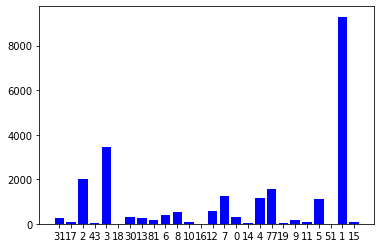

In [7]:
anno_cluster = dict()

for root, dirs, files in os.walk(output_path):
    for filename in files:
        if filename.endswith(".jpg"):
            full_filename = os.path.join(root, filename)
            cluster = full_filename.split("/")[-2]
            if not cluster in anno_cluster.keys():
                anno_cluster[str(cluster)] = 1
            else:
                anno_cluster[str(cluster)] += 1 

plt.bar(list(anno_cluster.keys()), anno_cluster.values(), color='b')
plt.show()

In [8]:
# directory where images are stored
DIR = "./usg_kmean_all"

def dataset_stats():
    
    # This is an array with the letters available.
    # If you add another animal later, you will need to structure its images in the same way
    # and add its letter to this array
    animal_characters = ['A0','B1', 'C2', 'D3', 'E4', 'F5', 'G6', 'H7', 'I8', 'J9', 'K10', 'L11', 'M12', 'N13', 'O14', 'P15', 'Q16', 'R17', 'S18', 'T19', 'U30', 'V31', 'W43', 'X51', 'Y77', 'Z81']
    
    # dictionary where we will store the stats
    stats = []
    
    for animal in animal_characters:
        # get a list of subdirectories that start with this character
        directory_list = sorted(glob.glob("{}/[{}]*".format(DIR, animal)))
        
        for sub_directory in directory_list:
            file_names = [file for file in os.listdir(sub_directory)]
            file_count = len(file_names)
            sub_directory_name = os.path.basename(sub_directory)
            stats.append({ "Code": sub_directory_name[0],
                            "Image count": file_count, 
                           "Folder name": os.path.basename(sub_directory),
                            "File names": file_names})
    
    
    df = pd.DataFrame(stats)
    
    return df

In [9]:
# Show codes with their folder names and image counts
dataset = dataset_stats().set_index("Code")
dataset[["Folder name", "Image count"]]

,Folder name,Image count
Code,,
A,A0-A,296
B,B1-B,9297
C,C2-C,1989
D,D3-D,3464
E,E4-E,1144
F,F5-F,1095
G,G6-G,414
H,H7-H,1232
I,I8-I,520


### Loading the images

In [10]:
# Function returns an array of images whoose filenames start with a given set of characters
# after resizing them to 224 x 224

def load_images(codes):
    
    # Define empty arrays where we will store our images and labels
    images = []
    labels = []
    
    for code in codes:
        # get the folder name for this code
        folder_name = dataset.loc[code]["Folder name"]
        
        for file in dataset.loc[code]["File names"]:                 
            # build file path
            try:
                file_path = os.path.join(DIR, folder_name, file)

                # Read the image
                image = cv2.imread(file_path)

                # Resize it to 224 x 224
                image = cv2.resize(image, (100,100))

                # Convert it from BGR to RGB so we can plot them later (because openCV reads images as BGR)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Now we add it to our array
                images.append(image)
                labels.append(code)
            except Exception as e:
                print(file)

    return images, labels

In [11]:
codes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
images, labels = load_images(codes)

### Photo time!

In [12]:
def show_random_images(images, labels, number_of_images_to_show=3):

    for code in list(set(labels)):

        indicies = [i for i, label in enumerate(labels) if label == code]
        random_indicies = [random.choice(indicies) for i in range(number_of_images_to_show)]
        print(random_indicies)
        figure, axis = plt.subplots(1, number_of_images_to_show, figsize=(30,30))

        print("{} random images for code {}".format(number_of_images_to_show, code))

        for image in range(number_of_images_to_show):
            axis[image].imshow(images[random_indicies[image]])
        plt.show()

In [13]:
len(images[0][1])

100

### Normalise...

In [14]:
def normalise_images(images, labels):

    # Convert to numpy arrays
    images = np.array(images, dtype=np.float32)
    labels = np.array(labels)

    # Normalise the images
    images /= 255.
    
    return images, labels

In [15]:
images, labels = normalise_images(images, labels)

### Train_test_split

In [16]:
def shuffle_data(images, labels):

    # Set aside the testing data. We won't touch these until the very end.
    X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=1, random_state=728)
    
    return X_train, y_train

In [17]:
X_train, y_train = shuffle_data(images, labels)

In [18]:
y_train_idx = np.array([codes.index(d) for d in y_train])

In [19]:
images.shape

(23180, 100, 100, 3)

In [20]:
X_train.shape

(23179, 100, 100, 3)

In [21]:
X_train_flat = X_train.reshape((23179,-1))

## PCA for visualize

In [27]:
def create_fit_PCA(data, n_components=2):
    
    p = PCA(n_components=n_components, random_state=728)
    p.fit(data)
    
    return p

In [28]:
vgg16_pca_viz = create_fit_PCA(X_train_flat, n_components=2)

In [29]:
vgg16_output_pca_viz = vgg16_pca_viz.transform(X_train_flat)

In [30]:
vgg16_output_pca_viz.shape

(23179, 2)

## K-mean time

In [23]:
def create_train_kmeans(data, number_of_clusters=len(codes)):
    # n_jobs is set to -1 to use all available CPU cores. This makes a big difference on an 8-core CPU
    # especially when the data size gets much bigger. #perfMatters
    
    k = KMeans(n_clusters=number_of_clusters, n_jobs=-1, random_state=728)

    # Let's do some timings to see how long it takes to train.
    start = time.time()

    # Train it up
    k.fit(data)

    # Stop the timing 
    end = time.time()

    # And see how long that took
    print("Training took {} seconds".format(end-start))
    
    return k

## K=3

K=3
Training took 115.40354299545288 seconds
[21750, 2375, 5399, 8691, 6941, 21329, 13388, 12692, 19095, 14247, 4040, 14719, 18409, 22378]
14 random images for code 0


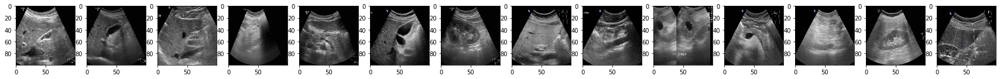

[1597, 842, 8497, 2265, 13586, 853, 9179, 18124, 8984, 19984, 11369, 8173, 9124, 737]
14 random images for code 1


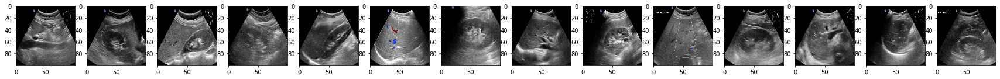

[13100, 20911, 3224, 7876, 815, 16619, 11158, 15124, 9485, 22554, 16611, 7619, 4086, 202]
14 random images for code 2


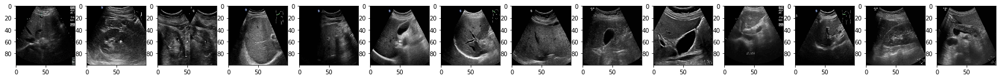

In [25]:
print("K=3")
K_vgg16_pca_3 = create_train_kmeans(X_train_flat, number_of_clusters=3)
k_vgg16_pred_pca_3 = K_vgg16_pca_3.predict(X_train_flat)
show_random_images(X_train, k_vgg16_pred_pca_3, number_of_images_to_show=14)

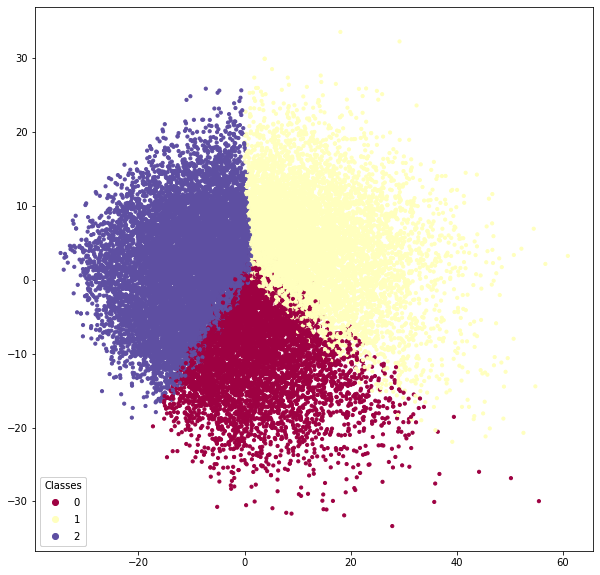

In [31]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_3, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{2: 10280, 1: 7357, 0: 5542}


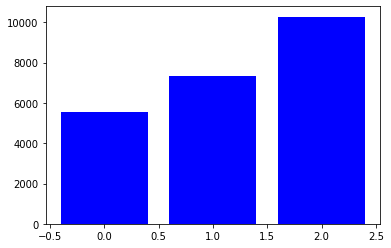

In [32]:
count_cluster = dict()

for i in k_vgg16_pred_pca_3:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  

plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=5

K=5
Training took 106.49921607971191 seconds
[17048, 11288, 6021, 723, 8194, 2156, 11474, 16417, 5486, 5874, 14667, 4180, 13287, 17348]
14 random images for code 0


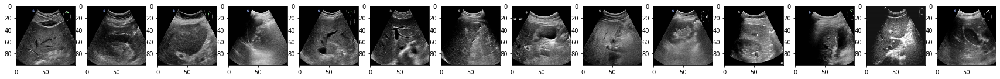

[6938, 18692, 18323, 17207, 13490, 16458, 16928, 1297, 8726, 6817, 9286, 9003, 7202, 15011]
14 random images for code 1


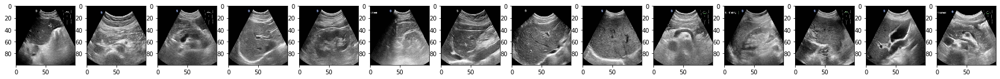

[22347, 7739, 10593, 7927, 1410, 7932, 17632, 8052, 17009, 14471, 21952, 21855, 17013, 1894]
14 random images for code 2


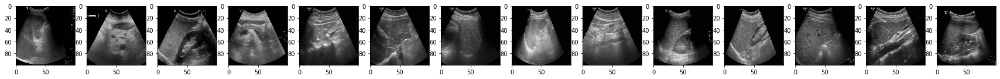

[9221, 15544, 22473, 17173, 9461, 18988, 6185, 8448, 3290, 14885, 10120, 7411, 6493, 18950]
14 random images for code 3


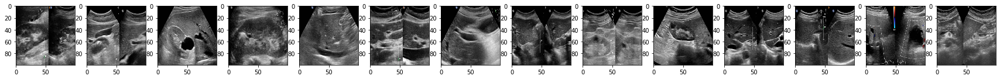

[19931, 9739, 23178, 8595, 8714, 12840, 7881, 260, 12165, 19965, 23077, 1338, 11567, 14731]
14 random images for code 4


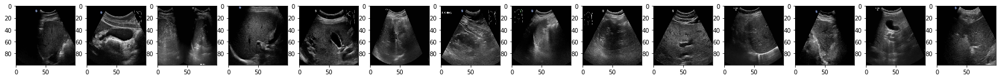

In [33]:
print("K=5")
K_vgg16_pca_5 = create_train_kmeans(X_train_flat, number_of_clusters=5)
k_vgg16_pred_pca_5 = K_vgg16_pca_5.predict(X_train_flat)
show_random_images(X_train, k_vgg16_pred_pca_5, number_of_images_to_show=14)

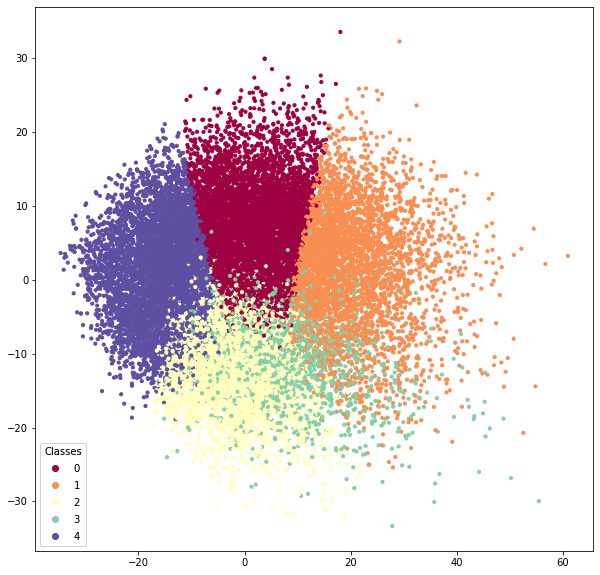

In [34]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_5, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{0: 7051, 4: 6214, 3: 1955, 1: 4051, 2: 3908}


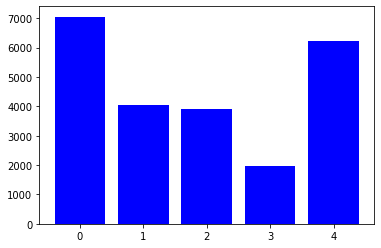

In [35]:
count_cluster = dict()

for i in k_vgg16_pred_pca_5:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=6

K=6
Training took 164.37453746795654 seconds
[4217, 16051, 1285, 11806, 3717, 1946, 6796, 11930, 10275, 1297, 15600, 20240, 4878, 15119]
14 random images for code 0


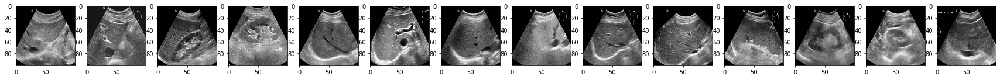

[4781, 23140, 10985, 20275, 9640, 19941, 9702, 13341, 18782, 985, 9244, 15718, 18541, 13767]
14 random images for code 1


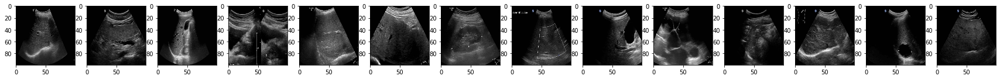

[2906, 15113, 12450, 7889, 11814, 11693, 19013, 15813, 9079, 18472, 11893, 12621, 12113, 18978]
14 random images for code 2


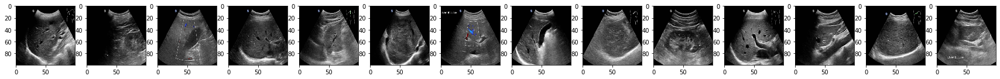

[3797, 18513, 18931, 22783, 2218, 3043, 4374, 21772, 2787, 4374, 4255, 17454, 5546, 19915]
14 random images for code 3


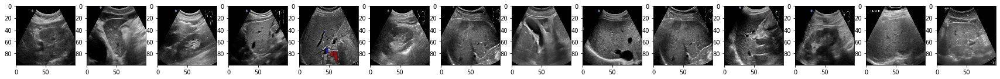

[20991, 22625, 8188, 16185, 5246, 10969, 8648, 16969, 680, 21194, 6804, 22946, 13610, 7149]
14 random images for code 4


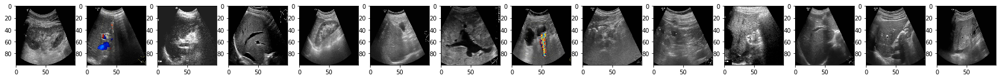

[1980, 12758, 22802, 5243, 8918, 12913, 3545, 7890, 19998, 21291, 15178, 1985, 5474, 20343]
14 random images for code 5


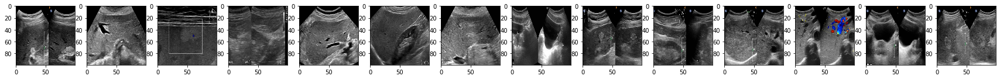

In [36]:
print("K=6")
K_vgg16_pca_6 = create_train_kmeans(X_train_flat, number_of_clusters=6)
k_vgg16_pred_pca_6 = K_vgg16_pca_6.predict(X_train_flat)
show_random_images(X_train, k_vgg16_pred_pca_6, number_of_images_to_show=14)

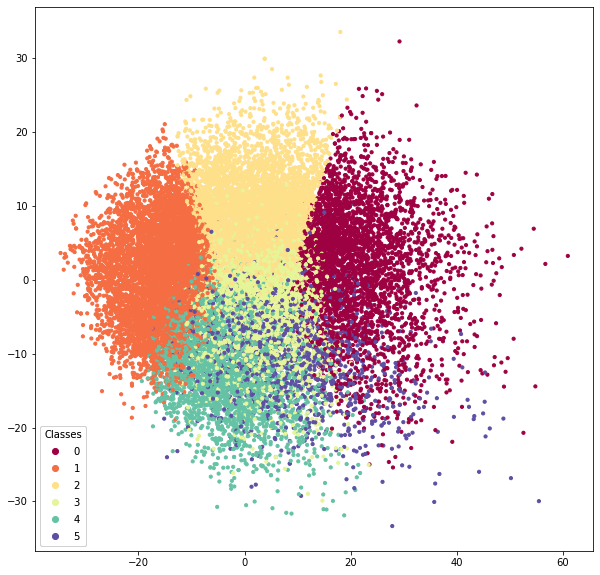

In [37]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_6, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{3: 3857, 1: 5875, 2: 5092, 5: 1655, 0: 3501, 4: 3199}


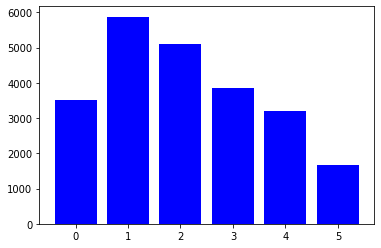

In [38]:
count_cluster = dict()

for i in k_vgg16_pred_pca_6:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=10

K=10
Training took 240.11073923110962 seconds
[19887, 16057, 20260, 10596, 14789, 13867, 18487, 4237, 1673, 6438, 8279, 12155, 14018, 11612]
14 random images for code 0


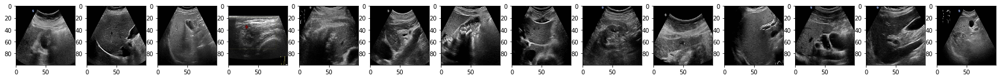

[18545, 15013, 19781, 15283, 5842, 14347, 8966, 6163, 14406, 1358, 16634, 2214, 21703, 13922]
14 random images for code 1


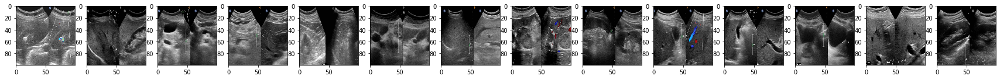

[21782, 7916, 15049, 20937, 9980, 7661, 2504, 3005, 1690, 2479, 8228, 22323, 15976, 12374]
14 random images for code 2


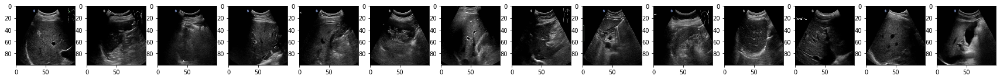

[1340, 11561, 2513, 18486, 14551, 22191, 1483, 9840, 19728, 13914, 2573, 20488, 9050, 444]
14 random images for code 3


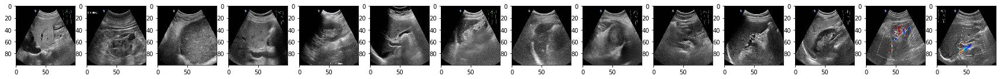

[1995, 3011, 10223, 20765, 9002, 3448, 11260, 2714, 19448, 6093, 9555, 13788, 10578, 14944]
14 random images for code 4


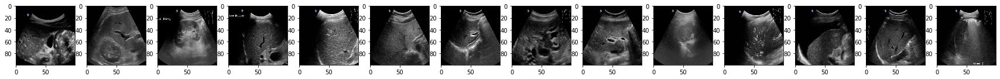

[20460, 15146, 21970, 7054, 1949, 5347, 9328, 20729, 16747, 6049, 9400, 10512, 11400, 22114]
14 random images for code 5


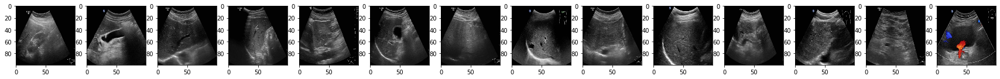

[14361, 1108, 15749, 18081, 5672, 9827, 295, 8518, 8678, 17794, 15198, 21523, 6974, 15603]
14 random images for code 6


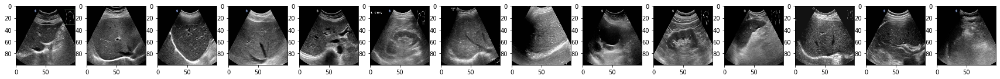

[18260, 20431, 12307, 4122, 5086, 14449, 8060, 21202, 18165, 6370, 10890, 3163, 1388, 6546]
14 random images for code 7


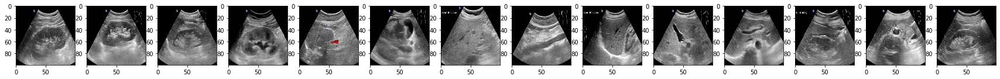

[8157, 10789, 21126, 15354, 955, 9735, 8570, 909, 11799, 11971, 3913, 7879, 5384, 16688]
14 random images for code 8


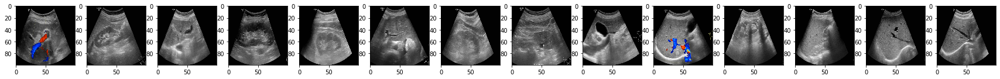

[5638, 16674, 2257, 7269, 1189, 911, 4654, 413, 6557, 16625, 20241, 12663, 5884, 900]
14 random images for code 9


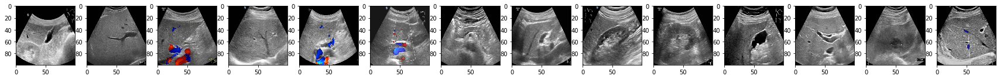

In [39]:
print("K=10")
K_vgg16_pca_10 = create_train_kmeans(X_train_flat, number_of_clusters=10)
k_vgg16_pred_pca_10 = K_vgg16_pca_10.predict(X_train_flat)
show_random_images(X_train, k_vgg16_pred_pca_10, number_of_images_to_show=14)

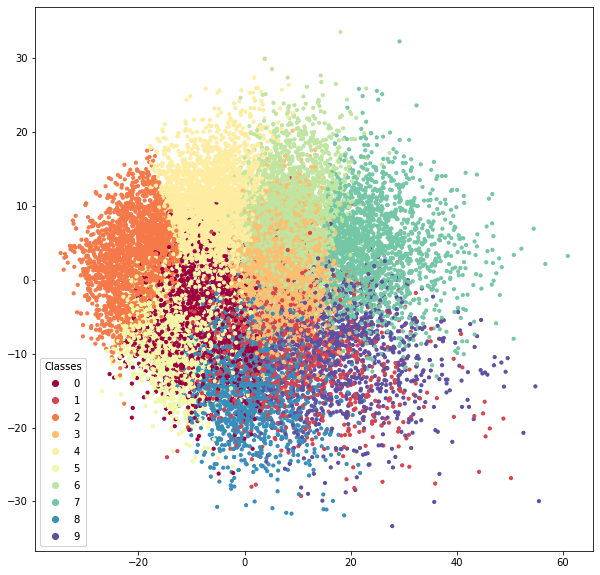

In [40]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_10, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{0: 2333, 4: 3625, 2: 2413, 6: 2786, 5: 2590, 9: 1161, 1: 1431, 3: 3187, 7: 1848, 8: 1805}


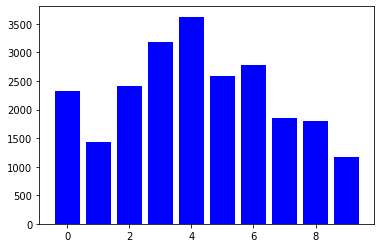

In [41]:
count_cluster = dict()

for i in k_vgg16_pred_pca_10:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster)  
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()

## K=15

K=15
Training took 359.6073739528656 seconds
[8508, 13870, 9642, 12414, 16740, 2604, 600, 21164, 6212, 3851, 5411, 13111, 15173, 10360]
14 random images for code 0


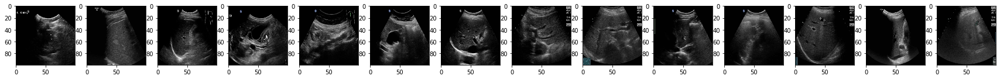

[10997, 9529, 12308, 12391, 6139, 14352, 7871, 8842, 6471, 9155, 3521, 11743, 8324, 1432]
14 random images for code 1


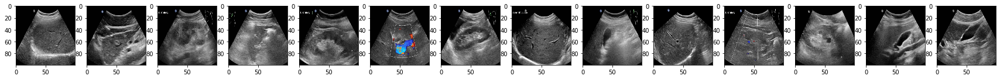

[8401, 4998, 7269, 14499, 68, 4402, 21954, 2992, 11570, 21533, 20225, 10445, 9249, 20671]
14 random images for code 2


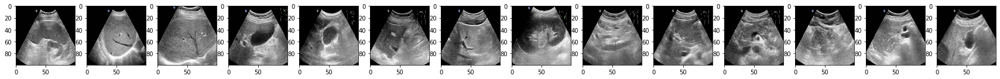

[5041, 22318, 13810, 17786, 9279, 15169, 5994, 12074, 6353, 20013, 10563, 3391, 22194, 15312]
14 random images for code 3


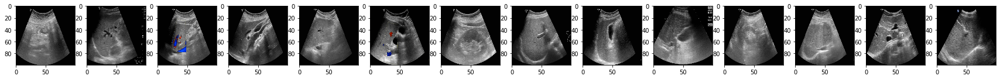

[17988, 4167, 6699, 7700, 20277, 10700, 10593, 12867, 5263, 22804, 13925, 17327, 21331, 10878]
14 random images for code 4


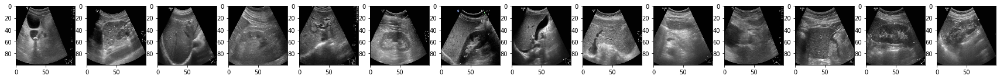

[18801, 22999, 2938, 7772, 16429, 20885, 7437, 512, 16860, 9352, 3287, 17629, 10544, 3260]
14 random images for code 5


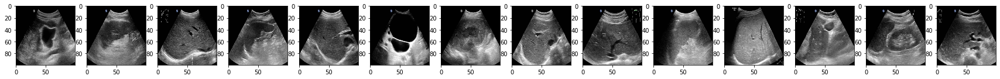

[18909, 23050, 17779, 13305, 16330, 14560, 21517, 702, 4209, 19125, 16338, 15006, 6897, 22056]
14 random images for code 6


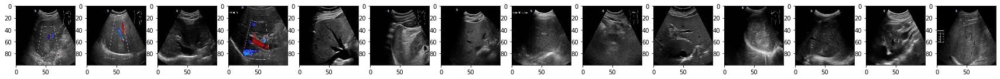

[3483, 21095, 9947, 20103, 14237, 7562, 7221, 11002, 13392, 11821, 20911, 10807, 11893, 16719]
14 random images for code 7


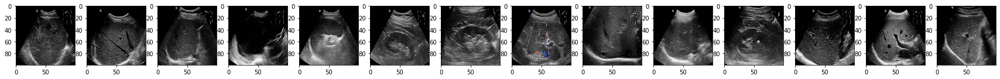

[12744, 18040, 1854, 15849, 9420, 5946, 9490, 19354, 7225, 19752, 2540, 2746, 10192, 1251]
14 random images for code 8


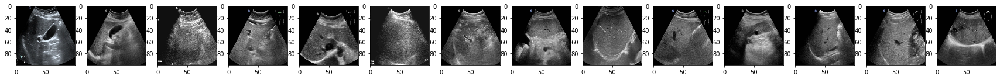

[17270, 13559, 1816, 988, 13516, 13775, 10461, 10984, 502, 19189, 2101, 3903, 1168, 18430]
14 random images for code 9


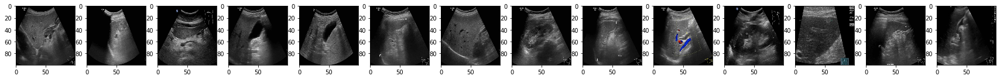

[14994, 18412, 7651, 16239, 5676, 10341, 16008, 4756, 13040, 2631, 10369, 15388, 2428, 7777]
14 random images for code 10


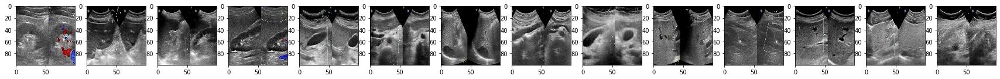

[13199, 13784, 16643, 19561, 13151, 21357, 986, 11639, 14622, 17102, 3647, 9900, 3396, 8637]
14 random images for code 11


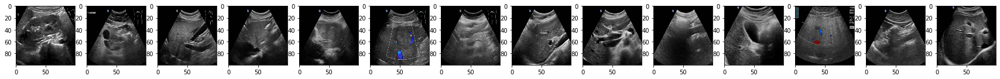

[1933, 4345, 16334, 8177, 18837, 2162, 7963, 538, 20755, 21907, 17167, 1347, 15063, 17548]
14 random images for code 12


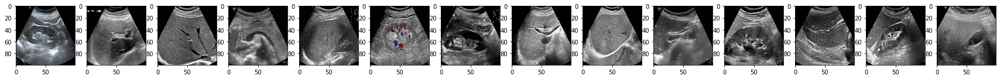

[21278, 19801, 4793, 19974, 9162, 22668, 7944, 5467, 3105, 22138, 19684, 16103, 9241, 7160]
14 random images for code 13


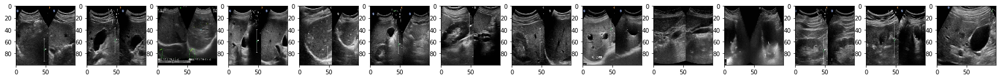

[10358, 14087, 14085, 14335, 21603, 3245, 8501, 21369, 638, 5230, 4903, 20100, 11566, 2489]
14 random images for code 14


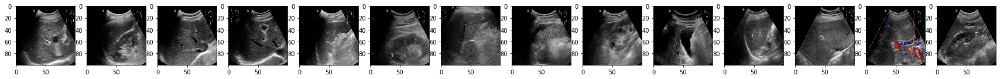

In [42]:
print("K=15")
K_vgg16_pca_15 = create_train_kmeans(X_train_flat, number_of_clusters=15)
k_vgg16_pred_pca_15 = K_vgg16_pca_15.predict(X_train_flat)
show_random_images(X_train, k_vgg16_pred_pca_15, number_of_images_to_show=14)

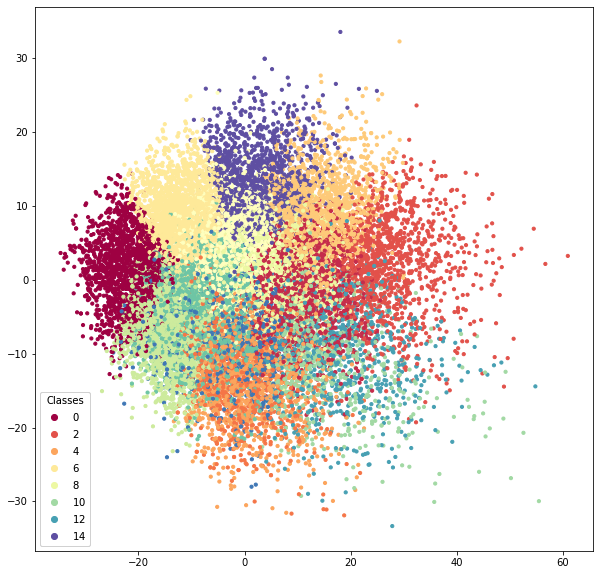

In [43]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = ax.scatter(vgg16_output_pca_viz[:, 0], vgg16_output_pca_viz[:, 1], c=k_vgg16_pred_pca_15, s=10, cmap='Spectral')

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Classes")
ax.add_artist(legend1)
plt.show()

{11: 2179, 6: 2313, 0: 1697, 14: 1619, 9: 1957, 7: 2217, 4: 1230, 10: 692, 2: 1223, 12: 873, 1: 1782, 8: 1647, 5: 1719, 13: 949, 3: 1082}


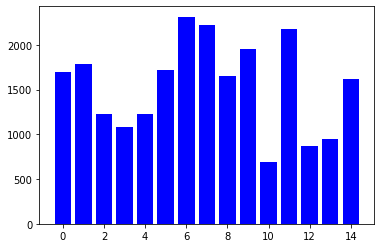

In [44]:
count_cluster = dict()

for i in k_vgg16_pred_pca_15:
    if i not in count_cluster.keys():
        count_cluster[i] = 1
    else:
        count_cluster[i] +=1

print(count_cluster) 
plt.bar(list(count_cluster.keys()), count_cluster.values(), color='b')
plt.show()